# Mastering Gradient Boosting with CatBoost

In this tutorial we will use dataset Amazon Employee Access Challenge from [Kaggle](https://www.kaggle.com) competition for our experiments. [Here](https://www.kaggle.com/c/amazon-employee-access-challenge/data) is the link to the challenge, that we will be exploring.

## Libraries installation

In [1]:
#!pip install --user --upgrade catboost
#!pip install --user --upgrade ipywidgets
#!pip install shap
#!pip install sklearn
#!jupyter nbextension enable --py widgetsnbextension

In [2]:
import os
import pandas as pd
import numpy as np
np.set_printoptions(precision=4)

import catboost
print(catboost.__version__)

The history saving thread hit an unexpected error (OperationalError('database is locked',)).History will not be written to the database.
0.15.1


## Reading the data

In [3]:
from catboost.datasets import amazon

# If you have "URLError: SSL: CERTIFICATE_VERIFY_FAILED" uncomment next two lines:
# import ssl
# ssl._create_default_https_context = ssl._create_unverified_context

# If you have any other error:
# Download datasets from http://bit.ly/2ZUXTSv and uncomment next line:
# train_df = pd.read_csv('train.csv', sep=',', header='infer')

(train_df, test_df) = amazon()

In [4]:
train_df.head()

,ACTION,RESOURCE,MGR_ID,ROLE_ROLLUP_1,ROLE_ROLLUP_2,ROLE_DEPTNAME,ROLE_TITLE,ROLE_FAMILY_DESC,ROLE_FAMILY,ROLE_CODE
0,1,39353,85475,117961,118300,123472,117905,117906,290919,117908
1,1,17183,1540,117961,118343,123125,118536,118536,308574,118539
2,1,36724,14457,118219,118220,117884,117879,267952,19721,117880
3,1,36135,5396,117961,118343,119993,118321,240983,290919,118322
4,1,42680,5905,117929,117930,119569,119323,123932,19793,119325


## Exploring the data

Label values extraction

In [5]:
y = train_df.ACTION
X = train_df.drop('ACTION', axis=1)

Categorical features declaration

In [6]:
cat_features = list(range(0, X.shape[1]))
print(cat_features)

[0, 1, 2, 3, 4, 5, 6, 7, 8]


Looking on label balance in dataset

In [7]:
print('Labels: {}'.format(set(y)))
print('Zero count = {}, One count = {}'.format(len(y) - sum(y), sum(y)))

Labels: {0, 1}
Zero count = 1897, One count = 30872


# Training the first model

In [8]:
from catboost import CatBoostClassifier
model = CatBoostClassifier(iterations=100)
model.fit(X, y, cat_features=cat_features, verbose=10)

Learning rate set to 0.349945
0:	learn: 0.4668712	total: 80ms	remaining: 7.92s
10:	learn: 0.1791505	total: 359ms	remaining: 2.91s
20:	learn: 0.1684338	total: 668ms	remaining: 2.51s
30:	learn: 0.1650651	total: 942ms	remaining: 2.1s
40:	learn: 0.1640099	total: 1.25s	remaining: 1.8s
50:	learn: 0.1619138	total: 1.53s	remaining: 1.47s
60:	learn: 0.1606667	total: 1.8s	remaining: 1.15s
70:	learn: 0.1595925	total: 2.01s	remaining: 823ms
80:	learn: 0.1578885	total: 2.27s	remaining: 531ms
90:	learn: 0.1566430	total: 2.5s	remaining: 247ms
99:	learn: 0.1556847	total: 2.71s	remaining: 0us


In [9]:
model.predict_proba(X)

array([[0.0073, 0.9927],
       [0.0078, 0.9922],
       [0.045 , 0.955 ],
       ...,
       [0.0128, 0.9872],
       [0.1204, 0.8796],
       [0.024 , 0.976 ]])

# Working with dataset

There are several ways of passing dataset to training - using X,y (the initial matrix) or using Pool class.
Pool class is the class for storing the dataset. In the next few blocks we'll explore the ways to create a Pool object.

You can use Pool class if the dataset has more than just X and y (for example, it has sample weights or groups) or if the dataset is large and it takes long time to read it into python.

In [10]:
from catboost import Pool
pool1 = Pool(data=X, label=y, cat_features=cat_features)

In [11]:
dataset_dir = './amazon'
if not os.path.exists(dataset_dir):
    os.makedirs(dataset_dir)

train_df.to_csv(
    os.path.join(dataset_dir, 'train.csv'),
    index=False, sep=',', header=True
)

In [12]:
!head -3 amazon/train.csv

ACTION,RESOURCE,MGR_ID,ROLE_ROLLUP_1,ROLE_ROLLUP_2,ROLE_DEPTNAME,ROLE_TITLE,ROLE_FAMILY_DESC,ROLE_FAMILY,ROLE_CODE
1,39353,85475,117961,118300,123472,117905,117906,290919,117908
1,17183,1540,117961,118343,123125,118536,118536,308574,118539


In [13]:
from catboost.utils import create_cd
feature_names = dict(list(enumerate(train_df.keys()))[1:])
    
create_cd(
    label=0,
    cat_features=list(range(1, train_df.shape[1])),
    feature_names=feature_names,
    output_path=os.path.join(dataset_dir, 'train.cd')
)

In [14]:
!cat amazon/train.cd

0	Label	
1	Categ	RESOURCE
2	Categ	MGR_ID
3	Categ	ROLE_ROLLUP_1
4	Categ	ROLE_ROLLUP_2
5	Categ	ROLE_DEPTNAME
6	Categ	ROLE_TITLE
7	Categ	ROLE_FAMILY_DESC
8	Categ	ROLE_FAMILY
9	Categ	ROLE_CODE


In [15]:
pool2 = Pool(
    data=os.path.join(dataset_dir, 'train.csv'), 
    delimiter=',', 
    column_description=os.path.join(dataset_dir, 'train.cd'),
    has_header=True
)

print('Dataset shape: {}\n'.format(pool2.shape))
print('Column names: {}'.format(pool2.get_feature_names()))

Dataset shape: (32769, 9)

Column names: ['RESOURCE', 'MGR_ID', 'ROLE_ROLLUP_1', 'ROLE_ROLLUP_2', 'ROLE_DEPTNAME', 'ROLE_TITLE', 'ROLE_FAMILY_DESC', 'ROLE_FAMILY', 'ROLE_CODE']


In [16]:
from catboost import CatBoostClassifier

CatBoostClassifier(iterations=3).fit(X, y, cat_features=cat_features);
CatBoostClassifier(iterations=3).fit(pool1)
CatBoostClassifier(iterations=3).fit(pool2)

Learning rate set to 0.5
0:	learn: 0.3971577	total: 28.7ms	remaining: 57.4ms
1:	learn: 0.2939111	total: 48.4ms	remaining: 24.2ms
2:	learn: 0.2500684	total: 59.3ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3971577	total: 37.5ms	remaining: 74.9ms
1:	learn: 0.2939111	total: 61.7ms	remaining: 30.9ms
2:	learn: 0.2500684	total: 75.1ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.3971577	total: 27.5ms	remaining: 55ms
1:	learn: 0.2939111	total: 44.7ms	remaining: 22.4ms
2:	learn: 0.2500684	total: 57.2ms	remaining: 0us


## Split your data into train and validation

In [17]:
from sklearn.model_selection import train_test_split

data = train_test_split(X, y, test_size=0.2, random_state=0)
X_train, X_validation, y_train, y_validation = data

train_pool = Pool(
    data=X_train, 
    label=y_train, 
    cat_features=cat_features
)

validation_pool = Pool(
    data=X_validation, 
    label=y_validation, 
    cat_features=cat_features
)

## Selecting the objective function

Possible options for binary classification:

`Logloss` for binary target.

`CrossEntropy` for probabilities in target.

In [18]:
model = CatBoostClassifier(
    iterations=5,
    learning_rate=0.1,
    # loss_function='CrossEntropy'
)
model.fit(train_pool, eval_set=validation_pool, verbose=False)

print('Model is fitted: {}'.format(model.is_fitted()))
print('Model params:\n{}'.format(model.get_params()))

Model is fitted: True
Model params:
{'learning_rate': 0.1, 'iterations': 5, 'loss_function': 'Logloss'}


## Stdout of the training

In [19]:
model = CatBoostClassifier(
    iterations=15,
#     verbose=5,
)
model.fit(train_pool, eval_set=validation_pool);

Learning rate set to 0.5
0:	learn: 0.3971379	test: 0.3960691	best: 0.3960691 (0)	total: 36.3ms	remaining: 509ms
1:	learn: 0.2948071	test: 0.2924021	best: 0.2924021 (1)	total: 67.3ms	remaining: 437ms
2:	learn: 0.2485015	test: 0.2455237	best: 0.2455237 (2)	total: 101ms	remaining: 402ms
3:	learn: 0.2234262	test: 0.2192359	best: 0.2192359 (3)	total: 129ms	remaining: 355ms
4:	learn: 0.2003506	test: 0.1938956	best: 0.1938956 (4)	total: 167ms	remaining: 334ms
5:	learn: 0.1916473	test: 0.1831990	best: 0.1831990 (5)	total: 192ms	remaining: 288ms
6:	learn: 0.1842038	test: 0.1759780	best: 0.1759780 (6)	total: 224ms	remaining: 256ms
7:	learn: 0.1808767	test: 0.1722588	best: 0.1722588 (7)	total: 264ms	remaining: 231ms
8:	learn: 0.1783738	test: 0.1678080	best: 0.1678080 (8)	total: 302ms	remaining: 201ms
9:	learn: 0.1769061	test: 0.1658153	best: 0.1658153 (9)	total: 330ms	remaining: 165ms
10:	learn: 0.1761268	test: 0.1653031	best: 0.1653031 (10)	total: 358ms	remaining: 130ms
11:	learn: 0.1752620	test

## Metrics calculation and graph plotting

In [20]:
model = CatBoostClassifier(
    iterations=50,
    learning_rate=0.5,
    custom_loss=['AUC', 'Accuracy']
)

model.fit(
    train_pool,
    eval_set=validation_pool,
    verbose=False,
    plot=True
);

## Model comparison

In [21]:
model1 = CatBoostClassifier(
    learning_rate=0.7,
    iterations=100,
    train_dir='learing_rate_0.7'
)

model2 = CatBoostClassifier(
    learning_rate=0.01,
    iterations=100,
    train_dir='learing_rate_0.01'
)

model1.fit(train_pool, eval_set=validation_pool, verbose=20)
model2.fit(train_pool, eval_set=validation_pool, verbose=20);

0:	learn: 0.3264513	test: 0.3248170	best: 0.3248170 (0)	total: 36.2ms	remaining: 3.59s
20:	learn: 0.1683868	test: 0.1595638	best: 0.1594426 (19)	total: 836ms	remaining: 3.15s
40:	learn: 0.1623000	test: 0.1604900	best: 0.1592935 (29)	total: 1.48s	remaining: 2.13s
60:	learn: 0.1566107	test: 0.1607838	best: 0.1592935 (29)	total: 2.08s	remaining: 1.33s
80:	learn: 0.1526952	test: 0.1603468	best: 0.1592935 (29)	total: 2.61s	remaining: 613ms
99:	learn: 0.1485242	test: 0.1604420	best: 0.1592935 (29)	total: 3.23s	remaining: 0us

bestTest = 0.1592934723
bestIteration = 29

Shrink model to first 30 iterations.
0:	learn: 0.6853769	test: 0.6853610	best: 0.6853610 (0)	total: 32.5ms	remaining: 3.22s
20:	learn: 0.5575636	test: 0.5568281	best: 0.5568281 (20)	total: 620ms	remaining: 2.33s
40:	learn: 0.4678357	test: 0.4664710	best: 0.4664710 (40)	total: 1.15s	remaining: 1.66s
60:	learn: 0.4029487	test: 0.4011429	best: 0.4011429 (60)	total: 1.68s	remaining: 1.07s
80:	learn: 0.3552680	test: 0.3531846	best:

In [22]:
from catboost import MetricVisualizer
MetricVisualizer(['learing_rate_0.7', 'learing_rate_0.01']).start()

## Best iteration

In [23]:
model = CatBoostClassifier(
    iterations=100,
#     use_best_model=False
)
model.fit(
    train_pool,
    eval_set=validation_pool,
    verbose=False,
    plot=True
);

In [24]:
print('Tree count: ' + str(model.tree_count_))

Tree count: 98


# Handling inbalanced data

If the dataset is inbalanced, you can try reweighting the object in the dataset - give more weight to the objects of the rare class. It can be done by setting a weight for every object (use `weight` parameter of fit function or of Pool initialisation).
Or it can be done by using `scale_pos_weight` parameter, which assignes weight value to all objects of the positive class.

In [25]:
scale_pos_weight = sum(y_train == 0) / (1.0 * sum(y_train == 1))
print("Positive count = ", sum(y_train == 1))
print("Negarive count = ", sum(y_train == 0))
print("Weight for class 1 objects = {:.4f}".format(scale_pos_weight))

Positive count =  24690
Negarive count =  1525
Weight for class 1 objects = 0.0618


In [26]:
model = CatBoostClassifier(
    iterations=100,
    scale_pos_weight=scale_pos_weight,
    custom_metric=['AUC', 'Accuracy:use_weights=false']
)
model.fit(
    X_train, y_train, cat_features=cat_features,
    eval_set=validation_pool,
    verbose=False,
    plot=True
);

## Cross-validation

In [27]:
from catboost import cv

params = {
    'loss_function': 'Logloss',
    'iterations': 80,
    'custom_loss': 'AUC',
    'learning_rate': 0.5,
}

cv_data = cv(
    params = params,
    pool = train_pool,
    fold_count=5,
    shuffle=True,
    partition_random_seed=0,
    plot=True,
    verbose=False
)

In [28]:
cv_data.head(10)

,iterations,test-Logloss-mean,test-Logloss-std,train-Logloss-mean,train-Logloss-std,test-AUC-mean,test-AUC-std
0,0,0.296923,0.000366,0.299131,0.000504,0.553022,0.012227
1,1,0.233942,0.002238,0.235404,0.000974,0.564945,0.027618
2,2,0.196598,0.005179,0.203295,0.002946,0.753321,0.043244
3,3,0.184489,0.004858,0.193357,0.002339,0.790716,0.031439
4,4,0.179559,0.003432,0.189843,0.001402,0.803748,0.014034
5,5,0.175799,0.002612,0.187142,0.001432,0.813313,0.006152
6,6,0.174192,0.002375,0.185267,0.002213,0.817983,0.004164
7,7,0.172486,0.001950,0.183675,0.001443,0.822385,0.004958
8,8,0.171843,0.001945,0.182597,0.001697,0.822950,0.004901
9,9,0.170756,0.001434,0.181760,0.001587,0.825785,0.006592


In [29]:
best_value = np.min(cv_data['test-Logloss-mean'])
best_iter = np.argmin(cv_data['test-Logloss-mean'])

print('Best validation Logloss score, not stratified: {:.4f}±{:.4f} on step {}'.format(
    best_value,
    cv_data['test-Logloss-std'][best_iter],
    best_iter)
)

Best validation Logloss score, not stratified: 0.1651±0.0038 on step 52


/place/home/ilikepugs/env3.6/lib/python3.6/site-packages/numpy/core/fromnumeric.py:56: FutureWarning: 
The current behaviour of 'Series.argmin' is deprecated, use 'idxmin'
instead.
The behavior of 'argmin' will be corrected to return the positional
minimum in the future. For now, use 'series.values.argmin' or
'np.argmin(np.array(values))' to get the position of the minimum
row.
  return getattr(obj, method)(*args, **kwds)


In [30]:
from catboost import cv

params = {
    'loss_function': 'Logloss',
    'iterations': 80,
    'custom_loss': 'AUC',
    'learning_rate': 0.5,
}

cv_data = cv(
    params = params,
    pool = train_pool,
    fold_count=5,
    shuffle=True,
    partition_random_seed=0,
    plot=True,
    stratified=True,
    verbose=False
)

In [31]:
best_value = cv_data['test-Logloss-mean'].min()
best_iter = cv_data['test-Logloss-mean'].values.argmin()

print('Best validation Logloss score, stratified: {:.4f}±{:.4f} on step {}'.format(
    best_value,
    cv_data['test-Logloss-std'][best_iter],
    best_iter)
)

Best validation Logloss score, stratified: 0.1651±0.0038 on step 52


## Sklearn Grid Search

In [32]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    "learning_rate": [0.001, 0.01, 0.5],
}

clf = CatBoostClassifier(
    iterations=20, 
    cat_features=cat_features, 
    verbose=20
)
grid_search = GridSearchCV(clf, param_grid=param_grid, cv=3)
results = grid_search.fit(X_train, y_train)
results.best_estimator_.get_params()

0:	learn: 0.6923673	total: 23.4ms	remaining: 445ms
19:	learn: 0.6778493	total: 408ms	remaining: 0us
0:	learn: 0.6923682	total: 23.2ms	remaining: 441ms
19:	learn: 0.6778558	total: 375ms	remaining: 0us
0:	learn: 0.6923673	total: 26.4ms	remaining: 501ms
19:	learn: 0.6778559	total: 396ms	remaining: 0us
0:	learn: 0.6853838	total: 21.7ms	remaining: 412ms
19:	learn: 0.5629615	total: 411ms	remaining: 0us
0:	learn: 0.6853928	total: 16.1ms	remaining: 306ms
19:	learn: 0.5630657	total: 297ms	remaining: 0us
0:	learn: 0.6853831	total: 19.3ms	remaining: 367ms
19:	learn: 0.5630284	total: 340ms	remaining: 0us
0:	learn: 0.3972934	total: 17.4ms	remaining: 331ms
19:	learn: 0.1766165	total: 485ms	remaining: 0us
0:	learn: 0.3977266	total: 19.5ms	remaining: 371ms
19:	learn: 0.1764631	total: 467ms	remaining: 0us
0:	learn: 0.3973406	total: 26ms	remaining: 494ms
19:	learn: 0.1717642	total: 475ms	remaining: 0us
0:	learn: 0.3971379	total: 15.1ms	remaining: 287ms
19:	learn: 0.1719069	total: 482ms	remaining: 0us


{'cat_features': [0, 1, 2, 3, 4, 5, 6, 7, 8],
 'verbose': 20,
 'iterations': 20,
 'learning_rate': 0.5,
 'loss_function': 'Logloss'}

## Overfitting Detector

In [33]:
model_with_early_stop = CatBoostClassifier(
    iterations=200,
    learning_rate=0.5,
    early_stopping_rounds=20
)

model_with_early_stop.fit(
    train_pool,
    eval_set=validation_pool,
    verbose=False,
    plot=True
);

In [34]:
print(model_with_early_stop.tree_count_)

42


### Overfitting Detector with eval metric

In [35]:
model_with_early_stop = CatBoostClassifier(
    eval_metric='AUC',
    iterations=200,
    learning_rate=0.5,
    early_stopping_rounds=20
)
model_with_early_stop.fit(
    train_pool,
    eval_set=validation_pool,
    verbose=False,
    plot=True
);

In [36]:
print(model_with_early_stop.tree_count_)

42


## Model predictions

In [37]:
model = CatBoostClassifier(iterations=200, learning_rate=0.03)
model.fit(train_pool, verbose=50);

0:	learn: 0.6562528	total: 101ms	remaining: 20.1s
50:	learn: 0.1942717	total: 3.61s	remaining: 10.5s
100:	learn: 0.1664301	total: 7.38s	remaining: 7.24s
150:	learn: 0.1601569	total: 9.96s	remaining: 3.23s
199:	learn: 0.1569382	total: 13.1s	remaining: 0us


In [38]:
print(model.predict_proba(X_validation))

[[0.0286 0.9714]
 [0.0162 0.9838]
 [0.0101 0.9899]
 ...
 [0.0318 0.9682]
 [0.0391 0.9609]
 [0.0222 0.9778]]


In [39]:
raw_pred = model.predict(
    X_validation,
    prediction_type='RawFormulaVal'
)

print(raw_pred)

[3.5242 4.107  4.5861 ... 3.4156 3.2021 3.7871]


In [40]:
from numpy import exp

sigmoid = lambda x: 1 / (1 + exp(-x))

probabilities = sigmoid(raw_pred)

print(probabilities)

[0.9714 0.9838 0.9899 ... 0.9682 0.9609 0.9778]


In [41]:
predicted_classes = model.predict(X_validation)
print(len(predicted_classes)) # count of objects
print(sum(predicted_classes)) # count of positive predictions

6554
6389.0


## Select decision boundary

![](https://habrastorage.org/webt/y4/1q/yq/y41qyqfm9mcerp2ziys48phpjia.png)

In [42]:
import matplotlib.pyplot as plt
from catboost.utils import get_roc_curve
from catboost.utils import get_fpr_curve
from catboost.utils import get_fnr_curve

curve = get_roc_curve(model, validation_pool)
(fpr, tpr, thresholds) = curve

(thresholds, fpr) = get_fpr_curve(curve=curve)
(thresholds, fnr) = get_fnr_curve(curve=curve)

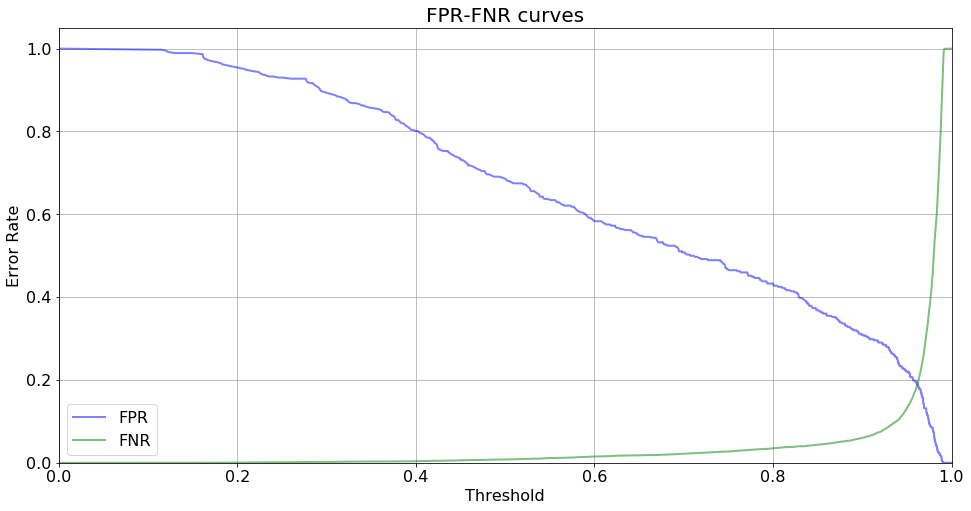

In [43]:
plt.figure(figsize=(16, 8))
style = {'alpha':0.5, 'lw':2}

plt.plot(thresholds, fpr, color='blue', label='FPR', **style)
plt.plot(thresholds, fnr, color='green', label='FNR', **style)

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.grid(True)
plt.xlabel('Threshold', fontsize=16)
plt.ylabel('Error Rate', fontsize=16)
plt.title('FPR-FNR curves', fontsize=20)
plt.legend(loc="lower left", fontsize=16);

In [44]:
from catboost.utils import select_threshold

print(select_threshold(model, validation_pool, FNR=0.01))
print(select_threshold(model, validation_pool, FPR=0.01))

0.5300177618786022
0.9889542797566186


## Metric evaluation on a new dataset

In [45]:
metrics = model.eval_metrics(
    data=validation_pool,
    metrics=['Logloss','AUC'],
    ntree_start=0,
    ntree_end=0,
    eval_period=1,
    plot=True
)

In [46]:
print('AUC values:\n{}'.format(np.array(metrics['AUC'])))

AUC values:
[0.5509 0.5509 0.6438 0.6438 0.633  0.633  0.6536 0.6536 0.6534 0.6534
 0.6614 0.6608 0.6631 0.6631 0.6633 0.662  0.662  0.6639 0.6633 0.6635
 0.6635 0.6633 0.6721 0.6959 0.7124 0.7186 0.7271 0.7374 0.7432 0.7429
 0.7456 0.767  0.7782 0.7855 0.7938 0.8001 0.8076 0.8191 0.8245 0.8273
 0.8287 0.8316 0.8323 0.8336 0.8351 0.8355 0.8362 0.8365 0.8373 0.838
 0.8385 0.8402 0.8403 0.8434 0.8437 0.8436 0.8443 0.8442 0.8441 0.8449
 0.8453 0.8455 0.8459 0.8457 0.8462 0.8472 0.8477 0.8476 0.8487 0.8494
 0.8507 0.8513 0.8513 0.8519 0.8521 0.8529 0.8537 0.8537 0.8537 0.8539
 0.8564 0.8579 0.8601 0.8627 0.8633 0.8643 0.8649 0.8672 0.8684 0.8687
 0.8697 0.8705 0.8711 0.8719 0.8729 0.8737 0.8746 0.875  0.8755 0.8761
 0.8769 0.8777 0.8783 0.8785 0.8783 0.8789 0.8791 0.8792 0.8799 0.8802
 0.8805 0.881  0.8811 0.8813 0.8814 0.8815 0.8814 0.8814 0.8814 0.8816
 0.8819 0.8821 0.8823 0.8824 0.8825 0.8827 0.8827 0.8828 0.8829 0.883
 0.8831 0.8831 0.8832 0.8834 0.8834 0.884  0.8845 0.8851 0.8851 0.8

## Feature importances

### Prediction values change

Default feature importances for binary classification is PredictionValueChange - how much on average does the model change when the feature value changes.
These feature importances are non negative.
They are normalized and sum to 1, so you can look on these values like percentage of importance.

In [47]:
np.array(model.get_feature_importance(prettified=True))

array([['ROLE_DEPTNAME', 18.854592099337363],
       ['RESOURCE', 17.028061417796568],
       ['MGR_ID', 16.07424481782719],
       ['ROLE_CODE', 13.665717803359167],
       ['ROLE_ROLLUP_2', 12.179890737354064],
       ['ROLE_FAMILY_DESC', 9.821699399024284],
       ['ROLE_FAMILY', 5.053895079497491],
       ['ROLE_TITLE', 3.85891134992299],
       ['ROLE_ROLLUP_1', 3.4629872958809274]], dtype=object)

### Loss function change

The non default feature importance approximates how much the optimized loss function will change if the value of the feature changes.
This importances might be negative if the feature has bad influence on the loss function.
The importances are not normalized, the absolute value of the importance has the same scale as the optimized loss value.
To calculate this importance value you need to pass train_pool as an argument.

In [48]:
np.array(model.get_feature_importance(
    data=train_pool, 
    type='LossFunctionChange', 
    prettified=True
))

array([['MGR_ID', 0.02186845947293457],
       ['RESOURCE', 0.019211056850588985],
       ['ROLE_CODE', 0.009805823545108203],
       ['ROLE_FAMILY_DESC', 0.00885578416486808],
       ['ROLE_DEPTNAME', 0.0072976258177284105],
       ['ROLE_ROLLUP_2', 0.00612549628480488],
       ['ROLE_TITLE', 0.0010877873469472162],
       ['ROLE_FAMILY', 0.0003659669175356238],
       ['ROLE_ROLLUP_1', 0.0001002066410684561]], dtype=object)

### Shap values

In [49]:
print(model.predict_proba([X.iloc[1,:]]))
print(model.predict_proba([X.iloc[91,:]]))

[[0.0118 0.9882]]
[[0.4754 0.5246]]


In [50]:
shap_values = model.get_feature_importance(
    data=validation_pool, 
    type='ShapValues'
)
expected_value = shap_values[0,-1]
shap_values = shap_values[:,:-1]
print(shap_values.shape)

(6554, 9)


In [51]:
proba = model.predict_proba([X.iloc[1,:]])[0]
raw = model.predict([X.iloc[1,:]], prediction_type='RawFormulaVal')[0]
print('Probabilities', proba)
print('Raw formula value %.4f' % raw)
print('Probability from raw value %.4f' % sigmoid(raw))

Probabilities [0.0118 0.9882]
Raw formula value 4.4281
Probability from raw value 0.9882


In [52]:
import shap

shap.initjs()
shap.force_plot(expected_value, shap_values[1,:], X_validation.iloc[1,:])

In [53]:
proba = model.predict_proba([X.iloc[91,:]])[0]
raw = model.predict([X.iloc[91,:]], prediction_type='RawFormulaVal')[0]
print('Probabilities', proba)
print('Raw formula value %.4f' % raw)
print('Probability from raw value %.4f' % sigmoid(raw))

Probabilities [0.4754 0.5246]
Raw formula value 0.0986
Probability from raw value 0.5246


In [54]:
import shap
shap.initjs()
shap.force_plot(expected_value, shap_values[91,:], X_validation.iloc[91,:])

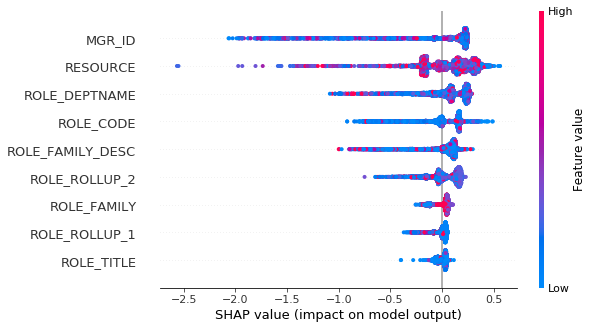

In [55]:
shap.summary_plot(shap_values, X_validation)

## Snapshotting

In [56]:
#!rm 'catboost_info/snapshot.bkp'

model = CatBoostClassifier(
    iterations=100,
    save_snapshot=True,
    snapshot_file='snapshot.bkp',
    snapshot_interval=1
)

model.fit(train_pool, eval_set=validation_pool, verbose=10);

Learning rate set to 0.294577

bestTest = 0.1559378784
bestIteration = 97

Shrink model to first 98 iterations.


## Saving the model

In [57]:
model = CatBoostClassifier(iterations=10)
model.fit(train_pool, eval_set=validation_pool, verbose=False)
model.save_model('catboost_model.bin')
model.save_model('catboost_model.json', format='json')

In [58]:
model.load_model('catboost_model.bin')
print(model.get_params())
print(model.learning_rate_)

{'iterations': 10, 'loss_function': 'Logloss', 'logging_level': 'Silent', 'verbose': 0}
0.5


## Solving MultiClassification problem

In [59]:
model = CatBoostClassifier(loss_function='MultiClass', iterations=50)

model.fit(
    train_pool,
    eval_set=validation_pool,
    verbose=False,
    plot=True
);

## Hyperparameter tunning

In [60]:
tunned_model = CatBoostClassifier(
    iterations=1000,
    learning_rate=0.03,
    depth=6,
    l2_leaf_reg=3,
    random_strength=1,
    bagging_temperature=1
)

tunned_model.fit(
    X_train, y_train,
    cat_features=cat_features,
    verbose=False,
    eval_set=(X_validation, y_validation),
    plot=True
);

# Speeding up the training

In [61]:
fast_model = CatBoostClassifier(
    boosting_type='Plain',
    rsm=0.5,
    one_hot_max_size=50,
    leaf_estimation_iterations=1,
    max_ctr_complexity=1,
    iterations=100,
    learning_rate=0.3,
    bootstrap_type='Bernoulli',
    subsample=0.5
)
fast_model.fit(
    X_train, y_train,
    cat_features=cat_features,
    verbose=False,
    eval_set=(X_validation, y_validation),
    plot=True
);

# Reducing model size

In [62]:
small_model = CatBoostClassifier(
    iterations=500,
    model_size_reg=50,
    max_ctr_complexity=1,
    ctr_leaf_count_limit=100
)
small_model.fit(
    X_train, y_train,
    cat_features=cat_features,
    verbose=False,
    eval_set=(X_validation, y_validation),
    plot=True
);